# Speech Understanding
## Programming Assignment - 1
---

## Question 2
Experimenting with Spectrograms
and Windowing Techniques.

### Task A

In [12]:
# Importing Libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from math import cos, pi
import torchaudio
import IPython.display as ipd
import torchaudio.transforms as T
import torch.nn.functional as F

In [5]:
# Load metadata
metadata_path = './UrbanSound8K/UrbanSound8K/metadata/UrbanSound8K.csv'
metadata = pd.read_csv(metadata_path)
metadata

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [6]:
# Load Audio files
audio_folder = './UrbanSound8K/UrbanSound8K/audio/'
folds = [f'fold{i}' for i in range(1, 11)]
folder_path = os.path.join(audio_folder, "fold1")

In [64]:
SAMPLE_WAV = os.path.join(folder_path, "77766-9-0-0.wav")
print(torchaudio.info(SAMPLE_WAV))

AudioMetaData(sample_rate=24000, num_frames=96000, num_channels=2, bits_per_sample=16, encoding=PCM_S)


Waveform shape: torch.Size([2, 96000])
Sample rate: 24000


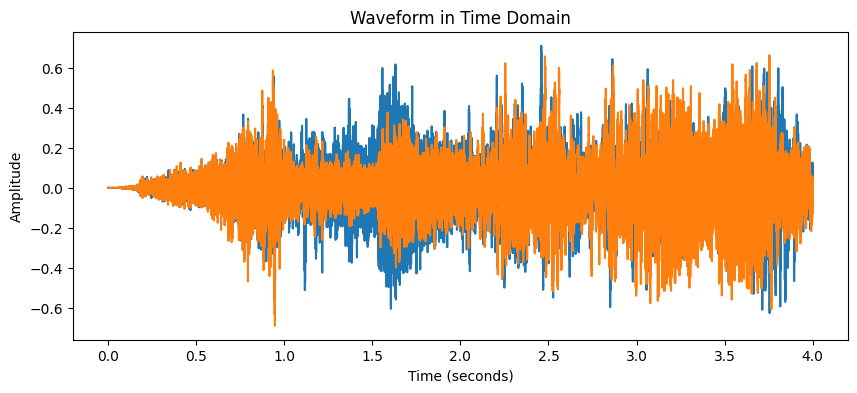

In [74]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV)

print(f"Waveform shape: {waveform.shape}")
print(f"Sample rate: {sample_rate}")

time_seconds = torch.arange(waveform.shape[1]) / sample_rate

# Time Domain
plt.figure(figsize=(10, 4))
plt.plot(time_seconds, waveform.t().numpy())
plt.title("Waveform in Time Domain")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.show()

# Display the audio player
ipd.display(ipd.Audio(SAMPLE_WAV))

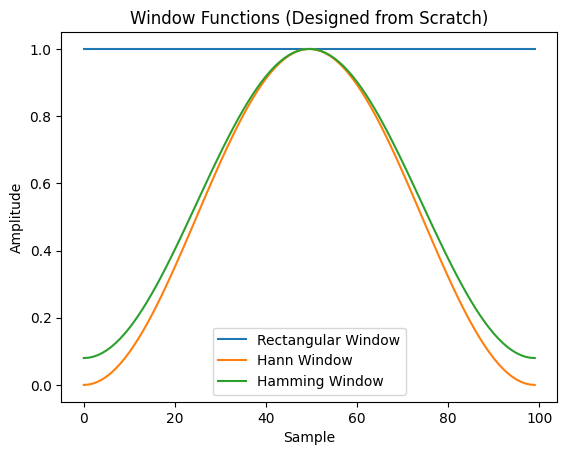

In [66]:
import matplotlib.pyplot as plt
window_length = 100

# Rectangular window (all ones)
rect_window = [1.0] * window_length

# Hann window
hanning_window = [0.5 * (1 - cos((2 * pi * n) / (window_length - 1))) for n in range(window_length)]

# Hamming window
hamming_window = [0.54 - 0.46 * cos((2 * pi * n) / (window_length - 1)) for n in range(window_length)]

plt.plot(rect_window, label="Rectangular Window")
plt.plot(hanning_window, label="Hann Window")
plt.plot(hamming_window, label="Hamming Window")
plt.legend()
plt.title("Window Functions (Designed from Scratch)")
plt.xlabel("Sample")
plt.ylabel("Amplitude")
plt.show()

In [77]:
import torch
import torchaudio
import matplotlib.pyplot as plt

def compute_spectrogram(window_type, window_length, hop_size, wav_file, target_length=1499, plot=True):
    waveform, sample_rate = torchaudio.load(wav_file)

    # Averaging stereo to mono
    if waveform.shape[0] > 1: 
        waveform = waveform.mean(dim=0, keepdim=True)  

    # Using inbuilt function of torch for windowing here
    if window_type == "hann":
        window = torch.hann_window(window_length)
    elif window_type == "hamming":
        window = torch.hamming_window(window_length)
    elif window_type == "rect":
        window = torch.ones(window_length)  
    
    # Computing STFT
    stft_result = torch.stft(
        waveform, 
        n_fft=window_length, 
        hop_length=hop_size, 
        win_length=window_length, 
        window=window, 
        return_complex=True
    )
    
    # using absolute values & converting to decibles
    spectrogram = torch.abs(stft_result)
    spectrogram_db = 20 * torch.log10(spectrogram + 1e-6) 
    print(spectrogram_db.shape)

    # Calculate time in seconds
    time_seconds = torch.arange(spectrogram_db.shape[2]) * hop_size / sample_rate

    # overlap percentage
    overlap_percentage = (1 - hop_size / window_length) * 100

    # the spectrogram
    if plot:   
        plt.figure(figsize=(10, 6))
        plt.imshow(spectrogram_db[0].numpy(), cmap='viridis', origin='lower', aspect='auto')
        n_fft = window_length
        freqs = torch.linspace(0, sample_rate // 2, spectrogram_db.shape[1])
        y_ticks = range(0, len(freqs), len(freqs) // 10) 
        plt.yticks(y_ticks, [f"{freqs[i].item():.0f} Hz" for i in y_ticks])
        x_ticks = range(0, len(time_seconds), len(time_seconds) // 10)
        plt.xticks(x_ticks, [f"{time_seconds[i].item():.2f} s" for i in x_ticks])
        
        plt.colorbar(format="%+2.0f dB")
        plt.title(f'Spectrogram with {window_type.capitalize()} Window')
        plt.xlabel('Time (seconds)')
        plt.ylabel('Frequency (Hz)')
        plt.show()

    return spectrogram_db, overlap_percentage

torch.Size([1, 257, 376])


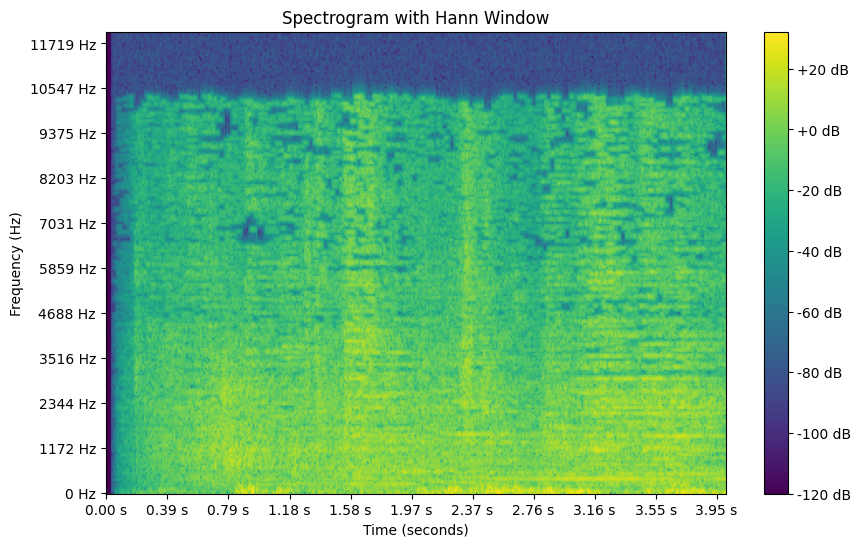

torch.Size([1, 257, 376])


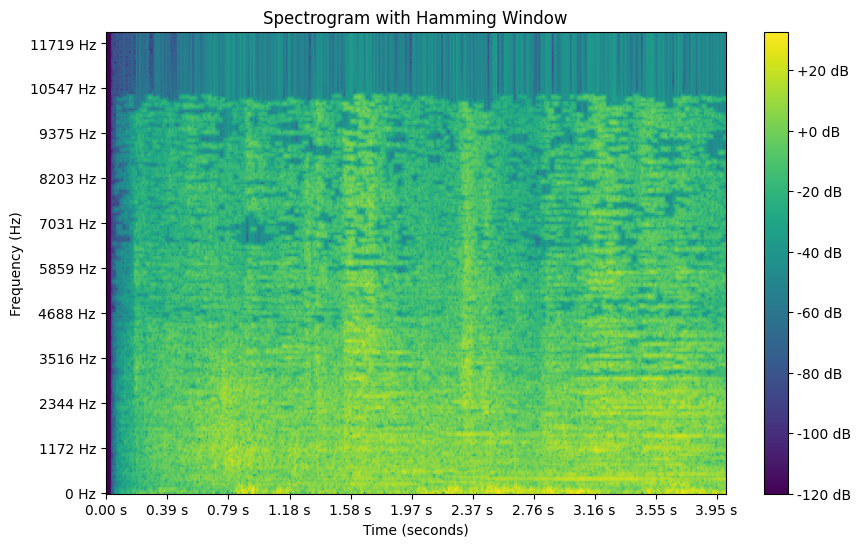

torch.Size([1, 257, 376])


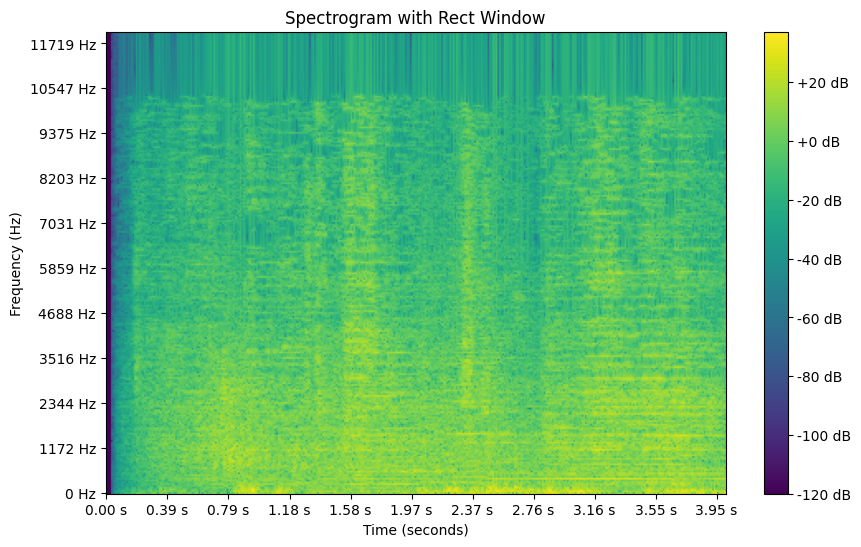

Overlap Percentage: 50.00%


In [78]:
# Comparing spectrograms
window_length = 512
hop_size = 256
spectrogram_hann, overlap_percentage = compute_spectrogram("hann", window_length, hop_size, SAMPLE_WAV)
spectrogram_hamm, overlap_percentage = compute_spectrogram("hamming", window_length, hop_size, SAMPLE_WAV)
spectrogram, overlap_percentage = compute_spectrogram("rect", window_length, hop_size, SAMPLE_WAV)

print(f"Overlap Percentage: {overlap_percentage:.2f}%")

## Building a Classifier

In [39]:
import torch.nn as nn
import torch.nn.functional as F
from tqdm.auto import tqdm

In [13]:
# HyperParameters
SAMPLE_RATE = 22050
WINDOW_LENGTH = 512
N_FFT = 512
HOP_LENGTH = 256
BATCH_SIZE = 32
EPOCHS = 5
LEARNING_RATE = 0.001
BASE_DIR = './UrbanSound8K/UrbanSound8K/audio/'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DEBUG = False # just to debug

In [71]:
# custom dataset using pytorch
class UrbanSoundDataset(torch.utils.data.Dataset):
    def __init__(self, metadata, base_dir, window_type):
        self.metadata = metadata.reset_index(drop=True)
        self.base_dir = base_dir
        
        if not os.path.exists(base_dir):
            raise FileNotFoundError(f"Dataset directory not found: {base_dir}")
        
        self.window = {
            'hann': torch.hann_window(WINDOW_LENGTH),
            'hamming': torch.hamming_window(WINDOW_LENGTH),
            'rectangular': torch.ones(WINDOW_LENGTH)
        }[window_type]

    def __len__(self):
        return len(self.metadata) if not DEBUG else min(100, len(self.metadata))

    def __getitem__(self, idx):
        try:
            row = self.metadata.iloc[idx]
            fold_dir = os.path.join(self.base_dir, f'fold{row["fold"]}')
            file_path = os.path.join(fold_dir, row['slice_file_name'])
            
            if not os.path.exists(file_path):
                raise FileNotFoundError(f"Audio file missing: {file_path}")
            
            # Load and process audio
            waveform, sample_rate = torchaudio.load(file_path)
            
            # Resample
            if sample_rate != SAMPLE_RATE:
                resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=SAMPLE_RATE)
                waveform = resampler(waveform)
            
            # Handle multichannels
            if waveform.shape[0] > 1:
                waveform = torch.mean(waveform, dim=0, keepdim=True)
            
            # making spectrograms uniform
            target_length = SAMPLE_RATE * 4
            if waveform.shape[1] < target_length:
                waveform = F.pad(waveform, (0, target_length - waveform.shape[1]))
            else:
                waveform = waveform[:, :target_length]

            # STFT
            stft = torch.stft(waveform.squeeze(0), 
                            n_fft=N_FFT,
                            hop_length=HOP_LENGTH,
                            window=self.window,
                            win_length=WINDOW_LENGTH,
                            return_complex=True)
            
            magnitude = torch.abs(stft)
            log_spectrogram = torch.log1p(magnitude)
            normalized = (log_spectrogram - log_spectrogram.mean()) / (log_spectrogram.std() + 1e-9)
            
            return normalized.unsqueeze(0), row['classID']
        
        except Exception as e:
            print(f"Error loading index {idx}: {str(e)}")
            return torch.zeros(1, N_FFT//2 + 1, (SAMPLE_RATE*4)//HOP_LENGTH + 1), -1

In [15]:
# CNN Model by pytorch
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, N_FFT//2 + 1, (SAMPLE_RATE*4)//HOP_LENGTH + 1)
            dummy_output = self.conv_layers(dummy_input)
            self.flattened_size = dummy_output.numel()
            
        self.fc_layers = nn.Sequential(
            nn.Linear(self.flattened_size, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 10)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)
        x = self.fc_layers(x)
        return x

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def train_model(window_type, train_loader, test_loader):
    model = SimpleCNN().to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
    criterion = nn.CrossEntropyLoss()

    # metrics
    train_accuracies = []
    test_accuracies = []
    test_losses = []
    all_preds = []
    all_labels = []

    for epoch in range(EPOCHS):
        model.train()
        train_loss = 0
        correct = 0
        total = 0
        
        # Training loop
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}')
        for inputs, labels in pbar:
            valid_mask = labels != -1
            if not valid_mask.any():
                continue
                
            inputs = inputs[valid_mask].to(DEVICE)
            labels = labels[valid_mask].to(DEVICE)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            pbar.set_postfix({'loss': f"{loss.item():.4f}", 'acc': f"{correct/total:.4f}"})
        
        #  training accuracy
        train_acc = correct / total
        train_accuracies.append(train_acc)

        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        val_loss = 0
        epoch_preds = []
        epoch_labels = []
        with torch.no_grad():
            for inputs, labels in test_loader:
                valid_mask = labels != -1
                if not valid_mask.any():
                    continue
                    
                inputs = inputs[valid_mask].to(DEVICE)
                labels = labels[valid_mask].to(DEVICE)
                
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
                
                epoch_preds.extend(predicted.cpu().numpy())
                epoch_labels.extend(labels.cpu().numpy())

        # test accuracy and loss
        if val_total > 0:
            val_acc = val_correct / val_total
            test_accuracies.append(val_acc)
            test_losses.append(val_loss / len(test_loader))
            all_preds.append(epoch_preds)
            all_labels.append(epoch_labels)
            print(f'Window: {window_type}, Epoch: {epoch+1}, Train Acc: {train_acc:.4f}, Test Acc: {val_acc:.4f}, Test Loss: {test_losses[-1]:.4f}')
    
    return train_accuracies, test_accuracies, test_losses, all_preds[-1], all_labels[-1]


Using device: cpu
Training samples: 7895
Testing samples: 837

Training with hann window


Epoch 1: 100%|██████████████████████████████████████████████| 247/247 [05:35<00:00,  1.36s/it, loss=0.8324, acc=0.4850]


Window: hann, Epoch: 1, Train Acc: 0.4850, Test Acc: 0.6547, Test Loss: 1.1870


Epoch 2: 100%|██████████████████████████████████████████████| 247/247 [04:34<00:00,  1.11s/it, loss=0.8937, acc=0.7210]


Window: hann, Epoch: 2, Train Acc: 0.7210, Test Acc: 0.6941, Test Loss: 1.2090


Epoch 3: 100%|██████████████████████████████████████████████| 247/247 [04:53<00:00,  1.19s/it, loss=0.6730, acc=0.8115]


Window: hann, Epoch: 3, Train Acc: 0.8115, Test Acc: 0.6930, Test Loss: 1.1793


Epoch 4: 100%|██████████████████████████████████████████████| 247/247 [04:46<00:00,  1.16s/it, loss=0.3748, acc=0.8642]


Window: hann, Epoch: 4, Train Acc: 0.8642, Test Acc: 0.7276, Test Loss: 1.3299


Epoch 5: 100%|██████████████████████████████████████████████| 247/247 [04:29<00:00,  1.09s/it, loss=0.1150, acc=0.9121]


Window: hann, Epoch: 5, Train Acc: 0.9121, Test Acc: 0.6750, Test Loss: 1.5118

Training with hamming window


Epoch 1: 100%|██████████████████████████████████████████████| 247/247 [03:54<00:00,  1.06it/s, loss=1.5451, acc=0.5446]


Window: hamming, Epoch: 1, Train Acc: 0.5446, Test Acc: 0.6559, Test Loss: 1.1546


Epoch 2: 100%|██████████████████████████████████████████████| 247/247 [03:42<00:00,  1.11it/s, loss=0.8774, acc=0.7539]


Window: hamming, Epoch: 2, Train Acc: 0.7539, Test Acc: 0.6440, Test Loss: 1.2569


Epoch 3: 100%|██████████████████████████████████████████████| 247/247 [03:37<00:00,  1.14it/s, loss=0.6855, acc=0.8300]


Window: hamming, Epoch: 3, Train Acc: 0.8300, Test Acc: 0.6404, Test Loss: 1.2784


Epoch 4: 100%|██████████████████████████████████████████████| 247/247 [03:32<00:00,  1.16it/s, loss=0.7212, acc=0.8770]


Window: hamming, Epoch: 4, Train Acc: 0.8770, Test Acc: 0.6750, Test Loss: 1.3956


Epoch 5: 100%|██████████████████████████████████████████████| 247/247 [03:30<00:00,  1.17it/s, loss=0.2470, acc=0.8965]


Window: hamming, Epoch: 5, Train Acc: 0.8965, Test Acc: 0.6858, Test Loss: 1.5333

Training with rectangular window


Epoch 1: 100%|██████████████████████████████████████████████| 247/247 [03:28<00:00,  1.18it/s, loss=1.0110, acc=0.4347]


Window: rectangular, Epoch: 1, Train Acc: 0.4347, Test Acc: 0.6237, Test Loss: 1.2672


Epoch 2: 100%|██████████████████████████████████████████████| 247/247 [03:28<00:00,  1.18it/s, loss=0.9721, acc=0.6456]


Window: rectangular, Epoch: 2, Train Acc: 0.6456, Test Acc: 0.6930, Test Loss: 1.1866


Epoch 3: 100%|██████████████████████████████████████████████| 247/247 [03:26<00:00,  1.20it/s, loss=0.9231, acc=0.7496]


Window: rectangular, Epoch: 3, Train Acc: 0.7496, Test Acc: 0.6786, Test Loss: 1.1696


Epoch 4: 100%|██████████████████████████████████████████████| 247/247 [03:27<00:00,  1.19it/s, loss=0.3089, acc=0.8054]


Window: rectangular, Epoch: 4, Train Acc: 0.8054, Test Acc: 0.6643, Test Loss: 1.3213


Epoch 5: 100%|██████████████████████████████████████████████| 247/247 [03:27<00:00,  1.19it/s, loss=0.7616, acc=0.8595]


Window: rectangular, Epoch: 5, Train Acc: 0.8595, Test Acc: 0.6822, Test Loss: 1.5251


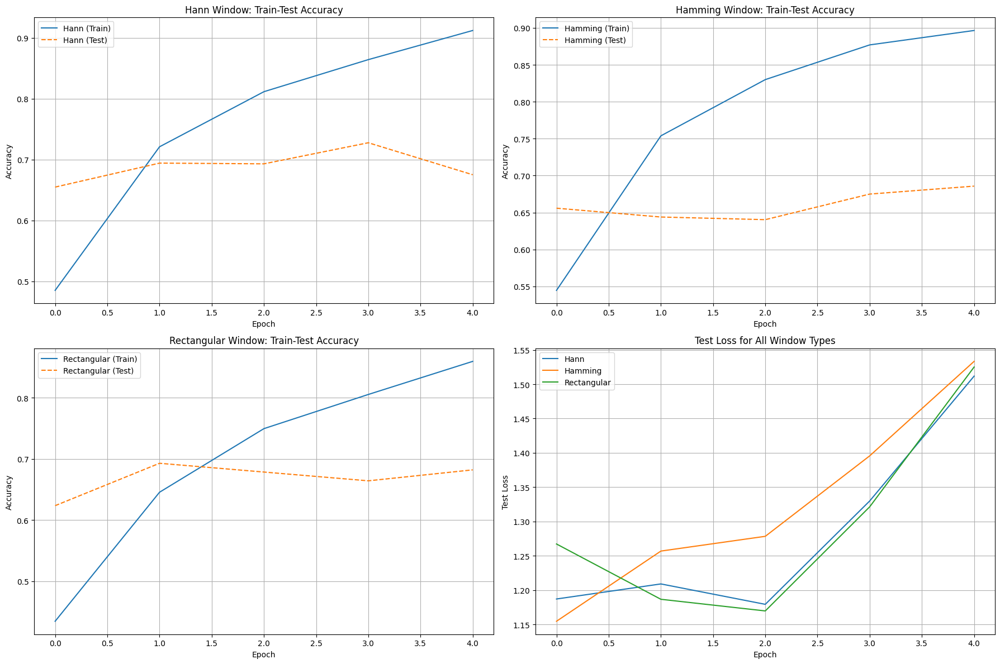

In [17]:
# Main Execution
if __name__ == "__main__":
    print(f"Using device: {DEVICE}")
    
    # Load metadata
    metadata_path = './UrbanSound8K/UrbanSound8K/metadata/UrbanSound8K.csv'
    if not os.path.exists(metadata_path):
        raise FileNotFoundError(f"Metadata file not found: {metadata_path}")
        
    metadata = pd.read_csv(metadata_path)
    
    # fold 10 for testing
    train_metadata = metadata[metadata['fold'] != 10]
    test_metadata = metadata[metadata['fold'] == 10]

    print(f"Training samples: {len(train_metadata)}")
    print(f"Testing samples: {len(test_metadata)}")

    results = {
        'hann': {'train_acc': [], 'test_acc': [], 'test_loss': [], 'preds': [], 'labels': []},
        'hamming': {'train_acc': [], 'test_acc': [], 'test_loss': [], 'preds': [], 'labels': []},
        'rectangular': {'train_acc': [], 'test_acc': [], 'test_loss': [], 'preds': [], 'labels': []}
    }

    window_types = ['hann', 'hamming', 'rectangular']
    for window in window_types:
        print(f'\n{"="*40}')
        print(f'Training with {window} window')
        print(f'{"="*40}')
        
        # datasets & dataloaders using PyTorch
        train_dataset = UrbanSoundDataset(train_metadata, BASE_DIR, window)
        test_dataset = UrbanSoundDataset(test_metadata, BASE_DIR, window)

        train_loader = torch.utils.data.DataLoader(
            train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        test_loader = torch.utils.data.DataLoader(
            test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        
        train_acc, test_acc, test_loss, preds, labels = train_model(window, train_loader, test_loader)
        results[window]['train_acc'] = train_acc
        results[window]['test_acc'] = test_acc
        results[window]['test_loss'] = test_loss
        results[window]['preds'] = preds
        results[window]['labels'] = labels
    
    plt.figure(figsize=(18, 12))
    
    # Train-Test Accuracy for Hann Window
    plt.subplot(2, 2, 1)
    plt.plot(results['hann']['train_acc'], label='Hann (Train)')
    plt.plot(results['hann']['test_acc'], '--', label='Hann (Test)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Hann Window: Train-Test Accuracy')
    plt.legend()
    plt.grid(True)
    
    # Train-Test Accuracy for Hamming Window
    plt.subplot(2, 2, 2)
    plt.plot(results['hamming']['train_acc'], label='Hamming (Train)')
    plt.plot(results['hamming']['test_acc'], '--', label='Hamming (Test)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Hamming Window: Train-Test Accuracy')
    plt.legend()
    plt.grid(True)
    
    # Train-Test Accuracy for Rectangular Window
    plt.subplot(2, 2, 3)
    plt.plot(results['rectangular']['train_acc'], label='Rectangular (Train)')
    plt.plot(results['rectangular']['test_acc'], '--', label='Rectangular (Test)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Rectangular Window: Train-Test Accuracy')
    plt.legend()
    plt.grid(True)
    
    # Test Loss for All Windows
    plt.subplot(2, 2, 4)
    plt.plot(results['hann']['test_loss'], label='Hann')
    plt.plot(results['hamming']['test_loss'], label='Hamming')
    plt.plot(results['rectangular']['test_loss'], label='Rectangular')
    plt.xlabel('Epoch')
    plt.ylabel('Test Loss')
    plt.title('Test Loss for All Window Types')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

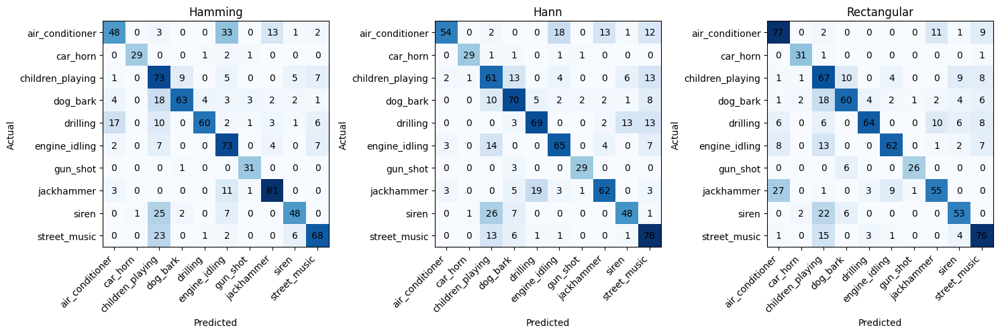

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Define class names
class_names = [
    "air_conditioner", "car_horn", "children_playing", "dog_bark", "drilling",
    "engine_idling", "gun_shot", "jackhammer", "siren", "street_music"
]

# Create a confusion matrix
def create_confusion_matrix(labels, preds, num_classes=10):
    return confusion_matrix(labels, preds, labels=np.arange(num_classes))

# Plot three confusion matrices in one row
def plot_confusion_matrices(cms, titles):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    for i, (cm, title) in enumerate(zip(cms, titles)):
        axs[i].imshow(cm, cmap='Blues')
        axs[i].set_title(title)
        axs[i].set_xlabel('Predicted')
        axs[i].set_ylabel('Actual')

        # Set class names as labels
        axs[i].set_xticks(np.arange(len(class_names)))
        axs[i].set_yticks(np.arange(len(class_names)))
        axs[i].set_xticklabels(class_names, rotation=45, ha="right")
        axs[i].set_yticklabels(class_names)

        # Add text annotations
        for x in range(cm.shape[0]):
            for y in range(cm.shape[1]):
                axs[i].text(y, x, str(cm[x, y]), ha='center', va='center', color='black')

    plt.tight_layout()
    plt.show()

# Generate confusion matrices
cm_hamming = create_confusion_matrix(results['hamming']['labels'], results['hamming']['preds'])
cm_hann = create_confusion_matrix(results['hann']['labels'], results['hann']['preds'])
cm_rect = create_confusion_matrix(results['rectangular']['labels'], results['rectangular']['preds'])

# Plot them
plot_confusion_matrices([cm_hamming, cm_hann, cm_rect], ["Hamming", "Hann", "Rectangular"])


Hamming and Hann windows mainly affect spectral leakage and resolution in the frequency domain. The Hamming window has a higher main lobe width but lower sidelobe attenuation, meaning it preserves more energy but introduces more spectral leakage. The Hann window has better sidelobe suppression but a wider main lobe, reducing leakage but slightly smearing frequencies.

For jackhammer vs. drilling classification:

Jackhammer sounds have more impulsive, broadband noise characteristics.
Drilling sounds have more periodic, tonal components.
Since Hamming allows more leakage, it may blur spectral details and introduce unwanted frequency components, making jackhammer sounds appear more like drilling. Thus, Hamming is more prone to misclassifying jackhammer as drilling.

### Task B

Processing: tiptoe_tulips.mp3
Spectrogram shape: torch.Size([1, 257, 862])


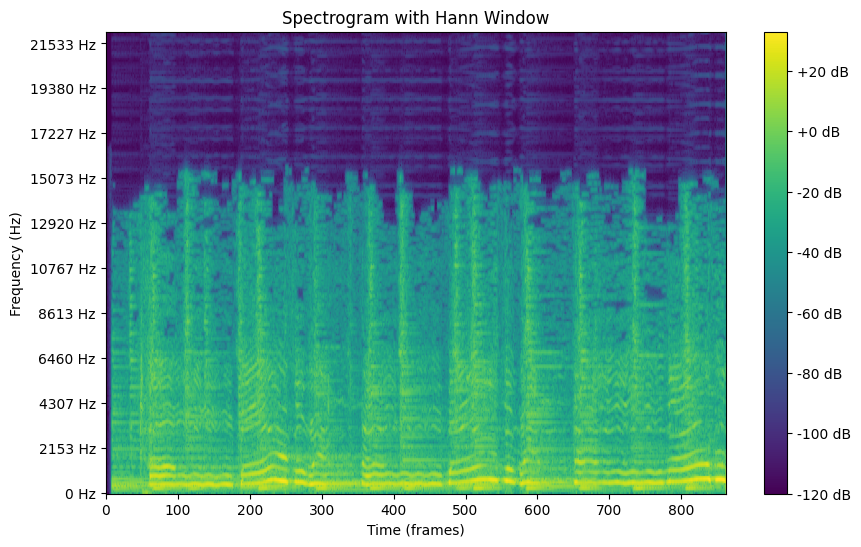

Overlap Percentage: 50.00%
Playing first 5 seconds of audio: tiptoe_tulips.mp3


Processing: pink_panther_theme.mp3
Spectrogram shape: torch.Size([1, 257, 862])


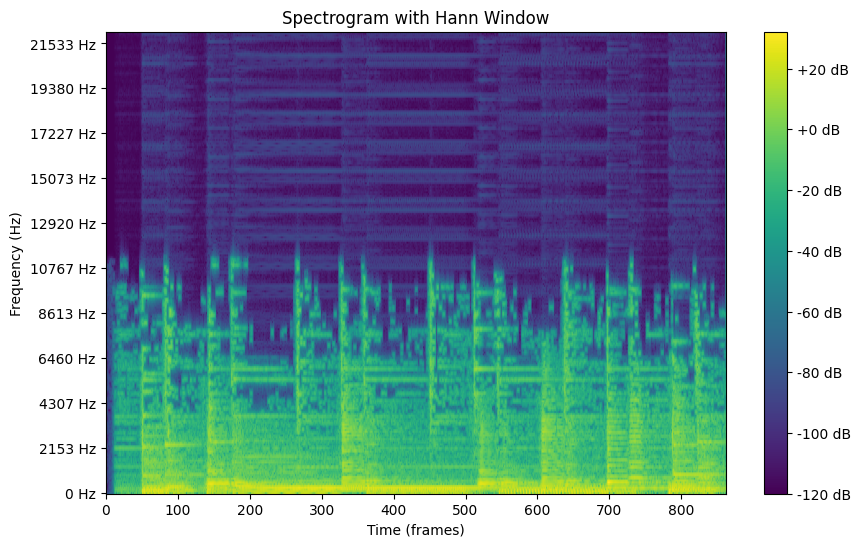

Overlap Percentage: 50.00%
Playing first 5 seconds of audio: pink_panther_theme.mp3


Processing: ra_one_theme.mp3
Spectrogram shape: torch.Size([1, 257, 862])


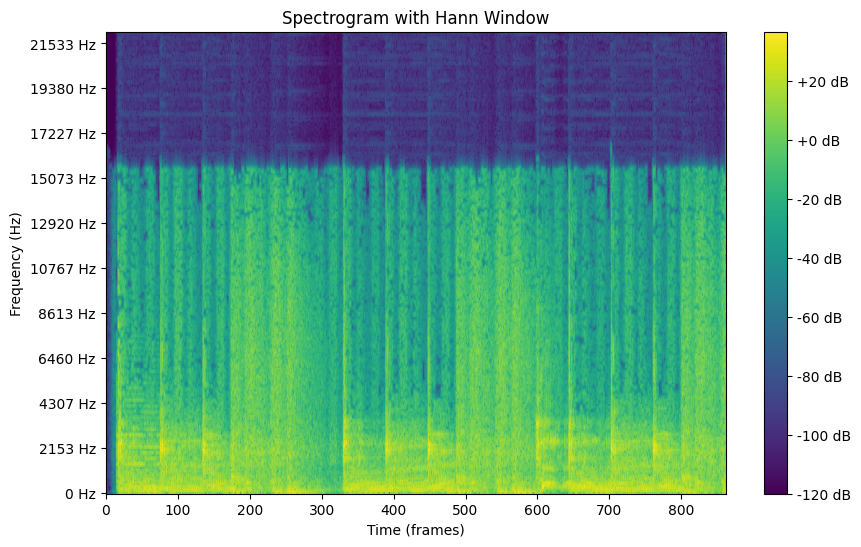

Overlap Percentage: 50.00%
Playing first 5 seconds of audio: ra_one_theme.mp3


Processing: tom_and_jerry_theme.mp3
Spectrogram shape: torch.Size([1, 257, 862])


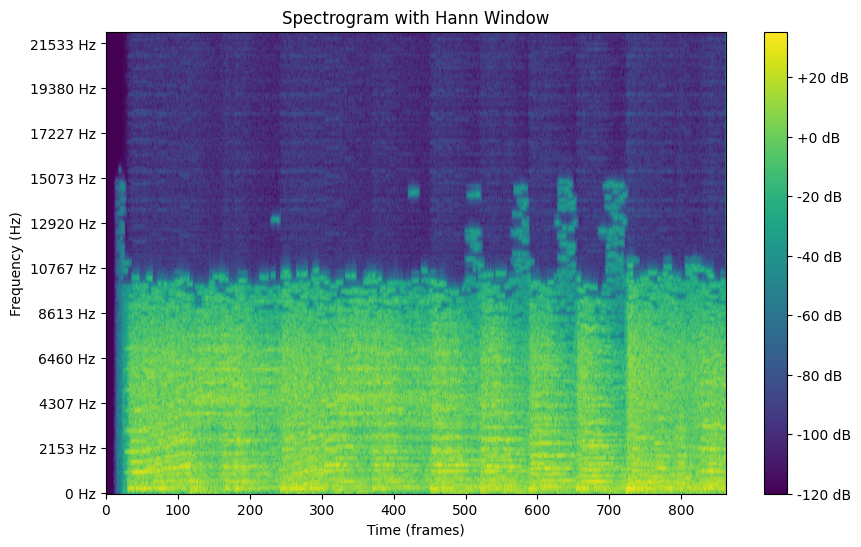

Overlap Percentage: 50.00%
Playing first 5 seconds of audio: tom_and_jerry_theme.mp3


In [52]:
import os
import torch
import torchaudio
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Function to compute and plot spectrogram
def compute_spectrogram(window_type, window_length, hop_size, wav_file, target_length=1499, plot=True, play_duration=None):
    # Load audio file
    waveform, sample_rate = torchaudio.load(wav_file)

    # Averaging stereo to mono
    if waveform.shape[0] > 1: 
        waveform = waveform.mean(dim=0, keepdim=True)  

    # Trim audio to the specified duration (in seconds)
    if play_duration is not None:
        num_samples = int(play_duration * sample_rate)
        waveform = waveform[:, :num_samples]

    # Using inbuilt function of torch for windowing here
    if window_type == "hann":
        window = torch.hann_window(window_length)
    elif window_type == "hamming":
        window = torch.hamming_window(window_length)
    elif window_type == "rect":
        window = torch.ones(window_length)  
    
    # Computing STFT
    stft_result = torch.stft(
        waveform, 
        n_fft=window_length, 
        hop_length=hop_size, 
        win_length=window_length, 
        window=window, 
        return_complex=True
    )
    
    # Using absolute values & converting to decibels
    spectrogram = torch.abs(stft_result)
    spectrogram_db = 20 * torch.log10(spectrogram + 1e-6) 
    print(f"Spectrogram shape: {spectrogram_db.shape}")

    # Calculate overlap percentage
    overlap_percentage = (1 - hop_size / window_length) * 100
    
    # Plot the spectrogram
    if plot:   
        plt.figure(figsize=(10, 6))
        plt.imshow(spectrogram_db[0].numpy(), cmap='viridis', origin='lower', aspect='auto')
        
        # Labeling frequencies instead of frequency bins
        n_fft = window_length
        freqs = torch.linspace(0, sample_rate // 2, spectrogram_db.shape[1])
        y_ticks = range(0, len(freqs), len(freqs) // 10) 
        plt.yticks(y_ticks, [f"{freqs[i].item():.0f} Hz" for i in y_ticks])
        
        plt.colorbar(format="%+2.0f dB")
        plt.title(f'Spectrogram with {window_type.capitalize()} Window')
        plt.xlabel('Time (frames)')
        plt.ylabel('Frequency (Hz)')
        plt.show()

    return spectrogram_db, overlap_percentage

# Folder containing audio files
audio_folder = "./test_audios"

# List of audio files
audio_files = [
    "tiptoe_tulips.mp3",
    "pink_panther_theme.mp3",
    "ra_one_theme.mp3",
    "tom_and_jerry_theme.mp3",
]

# Parameters for spectrogram computation
window_length = 512
hop_size = 256
window_type = "hann"  # You can change this to "hamming" or "rect" if needed
play_duration = 5  # Play and analyze only the first 5 seconds of each audio

# Compute spectrograms and play audio
for file in audio_files:
    file_path = os.path.join(audio_folder, file)
    if os.path.exists(file_path):
        print(f"Processing: {file}")
        
        # Call the compute_spectrogram function
        spectrogram_db, overlap_percentage = compute_spectrogram(
            window_type=window_type,
            window_length=window_length,
            hop_size=hop_size,
            wav_file=file_path,
            plot=True,
            play_duration=play_duration  # Pass the duration parameter
        )
        print(f"Overlap Percentage: {overlap_percentage:.2f}%")
        
        # Load and play the trimmed audio
        waveform, sample_rate = torchaudio.load(file_path)
        if play_duration is not None:
            num_samples = int(play_duration * sample_rate)
            waveform = waveform[:, :num_samples]
        print(f"Playing first {play_duration} seconds of audio: {file}")
        display(Audio(waveform.numpy(), rate=sample_rate))
    else:
        print(f"File not found: {file_path}")

In [ ]:
END